In [1]:
pip install python-igraph

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [1]:
import igraph as ig
from igraph import *
import json
import random
import numpy as np
from numpy import linalg 
import itertools
import matplotlib.pyplot as plt
from scipy.spatial import Delaunay  # needed for triangulation
import os
import pandas as pd
from copy import deepcopy

In [2]:
random.seed(2022)
np.random.seed(2022)

In [4]:
with open('los_angeles_censustracts.json') as f:
    census_tracts = json.loads(f.readline())

In [5]:
census_tracts['features'][0]['properties']

{'MOVEMENT_ID': '1', 'TRACT': '480302', 'DISPLAY_NAME': 'Census Tract 480302'}

In [6]:
np.array(census_tracts['features'][0]['geometry']['coordinates'][0]).mean(axis=0)  # [longitude, latitude]
# we use the mean to represent the longitude and latitude of a certain position

array([-118.12053321,   34.10309557])

In [7]:
display_names = dict()
coordinates = dict()

for area in census_tracts['features']:
    id = int(area['properties']['MOVEMENT_ID'])
    display_name = area['properties']['DISPLAY_NAME']
    display_names[id] = display_name
    a = area['geometry']['coordinates'][0]
    coordinates[id] = np.array(a if type(a[0][0]) == float else a[0]).mean(axis=0)

In [8]:
for i in range(5):
    key = i + 1
    print('{}: {}, {}'.format(key, display_names[key], coordinates[key]))

1: Census Tract 480302, [-118.12053321   34.10309557]
2: Census Tract 480303, [-118.13785063   34.09645121]
3: Census Tract 480304, [-118.13138209   34.09626386]
4: Census Tract 480400, [-118.13224544   34.10349303]
5: Census Tract 480500, [-118.14492317   34.0986815 ]


In [9]:
graph = Graph(directed=False)
graph.add_vertices(len(display_names))
graph.vs['display_name'] = list(display_names.values())  # index = id - 1
graph.vs['coordinates'] = list(coordinates.values())

In [10]:
month_filter = {12}  # for monthly aggregate data of 4th quarter, we can filter data based off of only December

edges = []
weights = []

with open('los_angeles-censustracts-2019-4-All-MonthlyAggregate.csv') as f:
    f.readline()  # skip the first line
    
    while True:
        line = f.readline()
        if line == '':
            break  # end of file
        
        vals = line.strip().split(',')
        
        # read edge info
        src, dest, month, dist = int(vals[0]), int(vals[1]), int(vals[2]), float(vals[3])

        # if data is not relevant, skip it
        if month not in month_filter:
            continue
            
        edges.append((src - 1, dest - 1))
        weights.append(dist)  

In [11]:
graph.add_edges(edges)
graph.es['weight'] = weights
del edges, weights

In [12]:
print(len(graph.vs), len(graph.es))

2716 1692450


QUESTION 9

Report the number of nodes and edges in G.

In [13]:
# keep only the giant connected component
components = graph.components()
graphcomponent = max(components, key=len)
vs_to_delete = [i for i in range(len(graph.vs)) if i not in graphcomponent]
graph.delete_vertices(vs_to_delete)

# remove duplicate edges
graph = graph.simplify(combine_edges=dict(weight='mean'))  # combine duplicate edges

In [14]:
print(len(graph.vs), len(graph.es))

2649 1003858


QUESTION 10: 

Build a minimum spanning tree (MST) of graph G. Report the street addresses
near the two endpoints (the centroid locations) of a few edges. Are the results intuitive?


In [15]:
#build a minimum spanning tree here of graph G
minspantree = graph.spanning_tree(weights=graph.es['weight'])

In [16]:
edf = minspantree.get_edge_dataframe()
edf.head()

,source,target,weight
edge ID,,,
0,0,2,129.765
1,0,13,118.335
2,1,2,90.235
3,1,3,126.475
4,1,9,125.675


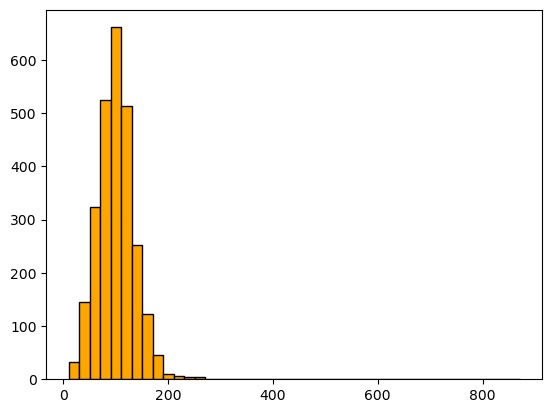

In [17]:
import matplotlib.pyplot as plt
weights = minspantree.es['weight']
binwidth = 20
bins = np.arange(min(weights), max(weights) + binwidth, binwidth)
plt.hist(weights, bins=bins,color = 'orange', edgecolor = 'black')
plt.show()

In [18]:
for i, e in enumerate(minspantree.es):
    print('Distance in miles: {:.3f}\nTime taken: {:.1f}\n---------\n'.format(linalg.norm(minspantree.vs[e.source]['coordinates'] - minspantree.vs[e.target]['coordinates'])* 69, e['weight']))
    if i > 10:
        break
    else:
        name_source = minspantree.vs[e.source]['display_name']
        name_target = minspantree.vs[e.target]['display_name']
        address_source = minspantree.vs[e.source]['coordinates']
        address_target = minspantree.vs[e.target]['coordinates']
        print(name_source, address_source, name_target, address_target)

Distance in miles: 0.885
Time taken: 129.8
---------

Census Tract 480302 [-118.12053321   34.10309557] Census Tract 480304 [-118.13138209   34.09626386]
Distance in miles: 0.570
Time taken: 118.3
---------

Census Tract 480302 [-118.12053321   34.10309557] Census Tract 481002 [-118.11656383   34.09585388]
Distance in miles: 0.447
Time taken: 90.2
---------

Census Tract 480303 [-118.13785063   34.09645121] Census Tract 480304 [-118.13138209   34.09626386]
Distance in miles: 0.621
Time taken: 126.5
---------

Census Tract 480303 [-118.13785063   34.09645121] Census Tract 480400 [-118.13224544   34.10349303]
Distance in miles: 0.812
Time taken: 125.7
---------

Census Tract 480303 [-118.13785063   34.09645121] Census Tract 480901 [-118.14184446   34.08538654]
Distance in miles: 0.618
Time taken: 119.9
---------

Census Tract 480304 [-118.13138209   34.09626386] Census Tract 481001 [-118.12911933   34.08759475]
Distance in miles: 0.936
Time taken: 125.2
---------

Census Tract 480400 [-1

# TSP Approximation

QUESTION 11: 

Determine what percentage of triangles in the graph (sets of 3 pints on the
map) satisfy the triangle inequality. You do not need to inspect all triangles, you can just estimate
by random sampling of 1000 triangles.

In [19]:
datasets = pd.read_csv('los_angeles-censustracts-2019-4-All-MonthlyAggregate.csv', usecols=['sourceid', 'dstid', 'mean_travel_time', 'month'])
datasets = datasets[datasets['month']==12][['sourceid', 'dstid', 'mean_travel_time']]
# change start of movement id 1 -> 0
edges = datasets.sub([1, 1, 0])
edges.rename(columns = {'mean_travel_time':'time'}, inplace = True)

In [20]:
from collections import defaultdict
vtxDict = defaultdict(list)
with open('los_angeles_censustracts.json') as f:
    census_tracts = json.loads(f.readline())
    for area in census_tracts['features']:
        # change start of movement id 1 -> 0
        id = int(area['properties']['MOVEMENT_ID']) - 1
        display = area['properties']['DISPLAY_NAME']
        a = area['geometry']['coordinates'][0]
        # considering polygon & multipolygon area types
        centloc = np.array(a if type(a[0][0]) == float else a[0]).mean(axis=0)
        vtxDict['id'].append(id)
        vtxDict['display'].append(display)
        vtxDict['centloc'].append(centloc)

vertices = pd.DataFrame(vtxDict)

In [21]:
graph = ig.Graph.DataFrame(edges, directed=False, vertices=vertices)
graphcomponent = graph.clusters().giant()
graphcomponent = graphcomponent.simplify(combine_edges=dict(time='mean'))
graphcomponent.es['distance'] = [np.linalg.norm(graphcomponent.vs[e.source]["centloc"] - graphcomponent.vs[e.target]["centloc"]) * 69
                      for e in graphcomponent.es]
graphcomponent.es['mark'] = [False] * len(graphcomponent.es)
print(len(graphcomponent.vs), len(graphcomponent.es))

C:\Users\yyxyy\AppData\Local\Temp\ipykernel_5984\2748771905.py:2: DeprecationWarning: Graph.clusters() is deprecated; use Graph.connected_components() instead
  gcc = g.clusters().giant()


2649 1003858


In [22]:
minspantree = graphcomponent.spanning_tree(weights=graphcomponent.es['time'])
for i in range(5):
  print(str(minspantree.vs[minspantree.es[i].source]['centloc']) + '&' +
        str(minspantree.vs[minspantree.es[i].target]['centloc']) + '&' +
        str(minspantree.es[i]['distance']) + '&' + str(minspantree.es[i]['time']) + '\\\\')
stl = {}
stl["vertex_size"] = 3

[-118.12053321   34.10309557]&[-118.13138209   34.09626386]&0.8846284729321783&129.76500000000001\\
[-118.12053321   34.10309557]&[-118.11656383   34.09585388]&0.5698168028981732&118.33500000000001\\
[-118.13785063   34.09645121]&[-118.13138209   34.09626386]&0.4465164669415551&90.235\\
[-118.13785063   34.09645121]&[-118.13224544   34.10349303]&0.6210205804548343&126.475\\
[-118.13785063   34.09645121]&[-118.14184446   34.08538654]&0.8116750364782253&125.675\\


In [23]:
# traingle inequality
N = 1000
cnt = 0
i = 0
while i < N:
    pints = np.random.randint(1, high=len(graphcomponent.vs), size=3)
    try:
        e1, e2, e3 = graphcomponent.get_eid(pints[0], pints[1]), graphcomponent.get_eid(pints[1], pints[2]), graphcomponent.get_eid(pints[2], pints[0])
        w1, w2, w3 = graphcomponent.es['time'][e1], graphcomponent.es['time'][e2], graphcomponent.es['time'][e3]       
    except: continue
    i += 1
    if w1+w2>w3 and w1+w3>w2 and w3+w2>w1: 
        cnt += 1
print(cnt / N)

0.91


QUESTION 12: Find an upper bound on the empirical performance of the pproximate algorithm:

In [24]:
def preorderTraversal(graph, root): 
    stkforpop = []
    former =[] 
    former.append(root) 
    stkforpop.append(root) 
    while len(stkforpop)>0:
        flag = 0
        if graph.vs[stkforpop[-1]].degree(mode='OUT') == 0: 
            stkforpop.pop() 
        else: 
            par = stkforpop[-1]
        for cnkid in graph.vs[par].neighbors(mode='OUT'): 
            if cnkid.index not in former: 
                flag = 1
                stkforpop.append(cnkid.index) 
                former.append(cnkid.index) 
                break
        if flag == 0: 
            stkforpop.pop() 
    return former

In [25]:
def twoApprox(graph, root, weight): 
    pre = preorderTraversal(minspantree, root)
    pre.append(root)
    approximatecost = 0
    final_path = [root]
    for i in range(len(pre) - 1):
        eid = graph.get_eid(pre[i], pre[i+1], directed=False, error=False)
        if eid != -1:
            approximatecost += graph.es[eid]['time']
            final_path.append(pre[i+1])
        else:
            approximatecost += (graph.shortest_paths(pre[i], pre[i+1], weights=weight))[0][0]
            path = graph.get_shortest_paths(pre[i], pre[i+1], weights=weight, output='vpath')
            for ind in path[0][1:]:
                final_path.append(ind)
    return approximatecost, final_path

In [26]:
import sys
from tqdm import tqdm 
minspantree_cost = sum(minspantree.es['time'])
approximatecost_min = sys.maxsize
approximate_pth = []
pints = np.random.randint(1, high=len(graphcomponent.vs), size=30)
for point in tqdm(pints):
    cst_i, path = twoApprox(graphcomponent, point, 'time')
    if cst_i < approximatecost_min:
        approximatecost_min = cst_i
        approximate_pth = path

upperbound = approximatecost_min / minspantree_cost

print(minspantree_cost)
print(approximatecost_min)
print('the upper bound of the empiricel performance',upperbound)

  0%|          | 0/30 [00:00<?, ?it/s]C:\Users\yyxyy\AppData\Local\Temp\ipykernel_5984\2647402605.py:12: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  cost_approx += (g.shortest_paths(pre[i], pre[i+1], weights=weight))[0][0]
100%|██████████| 30/30 [01:10<00:00,  2.34s/it]

269084.5449999994
455144.9099999999
the upper bound of the empiricel performance 1.6914568987973684


QUESTION 13: Plot the trajectory that Santa has to travel!

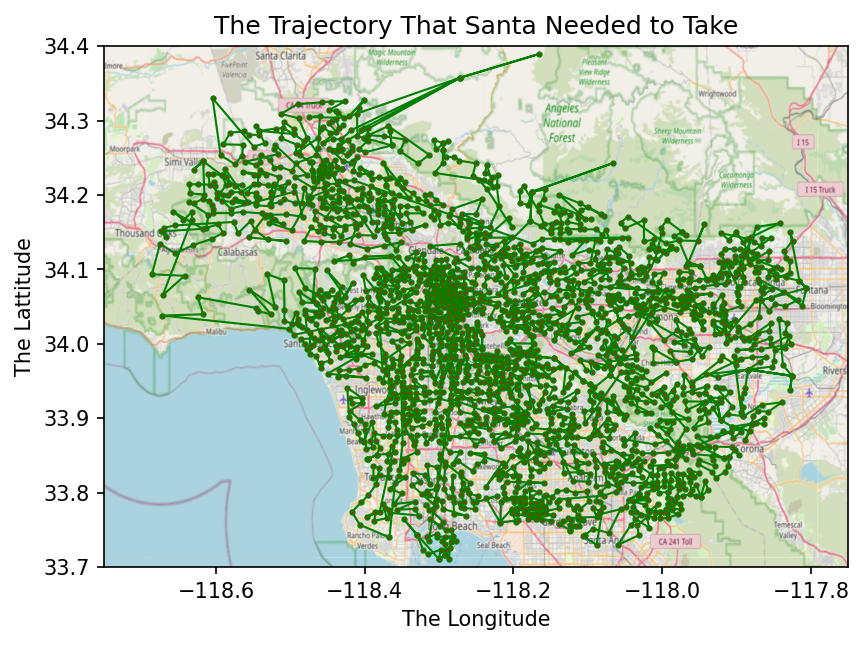

In [30]:
x = [graphcomponent.vs[i]['centloc'][0] for i in approximate_pth]
y = [graphcomponent.vs[i]['centloc'][1] for i in approximate_pth]

bbox = (-118.75, -117.75, 33.7, 34.4)
la_map = plt.imread('map_LA.jpg')

plt.figure(dpi=150)
plt.plot(x, y, marker='o', linewidth=1, markersize=2, markerfacecolor='red', color='green')
plt.title('The Trajectory That Santa Needed to Take')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.xlim(bbox[0], bbox[1])
plt.ylim(bbox[2], bbox[3])
plt.imshow(la_map, zorder=0, extent=bbox, aspect='equal')
plt.show()

QUESTION 14: Plot the road mesh that you obtain and explain the result. Create a graph G∆ whose nodes are different locations and its edges are produced by triangulation.

In [31]:
def plot_graph(graph, title=''):
    plt.figure(dpi=150)
    
    # Iterate over the edges in the graph
    for e in graph.es:
        v1 = graph.vs[e.source]['centloc']
        v2 = graph.vs[e.target]['centloc']
        
        # Extract the x and y coordinates of the edge vertices
        x = [v1[0], v2[0]]
        y = [v1[1], v2[1]]
        
        # Plot the edge with the appropriate color based on 'mark' attribute
        plt.plot(x, y, c='orange' if e['mark'] else 'green', linewidth=1)

    plt.title(title)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    
    # Plot the background map
    plt.imshow(la_map, zorder=0, extent=bbox, aspect='equal')
    
    # Set the plot limits based on the bounding box
    plt.xlim(bbox[0], bbox[1])
    plt.ylim(bbox[2], bbox[3])


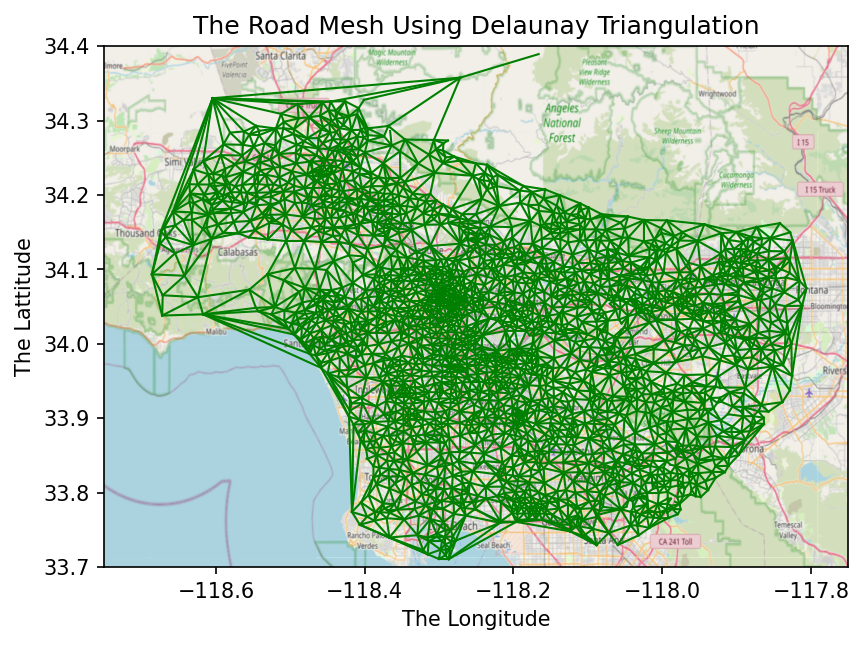

In [32]:
# Perform Delaunay triangulation on the graph component vertices
dlnayelau = Delaunay(graphcomponent.vs['centloc'])

edges_d = []

# Iterate over the simplices in the Delaunay triangulation
for i in range(dlnayelau.simplices.shape[0]):
    # Iterate over the edges of each simplex
    for a, b in ((0, 1), (1, 2), (0, 2)):
        # Check if the vertices of the edge are connected in the original graph
        if graphcomponent.are_connected(dlnayelau.simplices[i][a], dlnayelau.simplices[i][b]):
            # Add the connected edge to the list
            edges_d.append((dlnayelau.simplices[i][a], dlnayelau.simplices[i][b]))

# Create a subgraph with the edges obtained from Delaunay triangulation
g_d = graphcomponent.subgraph_edges(edges_d)

# Plot the graph using the obtained subgraph
plot_graph(g_d, 'The Road Mesh Using Delaunay Triangulation')
plt.show()


QUESTION 15: Using simple math, calculate the traffic flow for each road in terms of cars/hour. Report your derivation.

In [33]:
# Calculate the velocity based on distance and time
velocity = np.array(g_d.es['distance']) / np.array(g_d.es['time']) * 3600

# Calculate the time gap based on velocity
time_gap = (0.003 / velocity) + (2 / 3600)

# Calculate the capacity based on the time gap
capacity = 4 / time_gap

# Assign the capacity to the graph edges
g_d.es['capacity'] = capacity

# Print the traffic flow for each road
for tempIndex in range(len(capacity)):
    print('The traffic flow for the road:', capacity[tempIndex])


the traffic flow for the road: 5901.479477772023
the traffic flow for the road: 5740.560915660436
the traffic flow for the road: 5489.863522802464
the traffic flow for the road: 5338.458834851277
the traffic flow for the road: 5167.920823281143
the traffic flow for the road: 5240.245832999153
the traffic flow for the road: 5525.159004230096
the traffic flow for the road: 5515.191481722083
the traffic flow for the road: 5094.869813654353
the traffic flow for the road: 5842.964493659686
the traffic flow for the road: 5480.117267638877
the traffic flow for the road: 5129.858402875141
the traffic flow for the road: 5577.413620752399
the traffic flow for the road: 5536.058730371785
the traffic flow for the road: 5996.736412241544
the traffic flow for the road: 5084.992636235333
the traffic flow for the road: 6054.114550830973
the traffic flow for the road: 5908.201935933153
the traffic flow for the road: 5715.5457293437885
the traffic flow for the road: 5397.062719871302
the traffic flow fo

QUESTION 16: Calculate the maximum number of cars that can commute per hour from Malibu to Long Beach. Also calculate the number of edge-disjoint paths between the two spots. Does the
number of edge-disjoint paths match what you see on your road map?

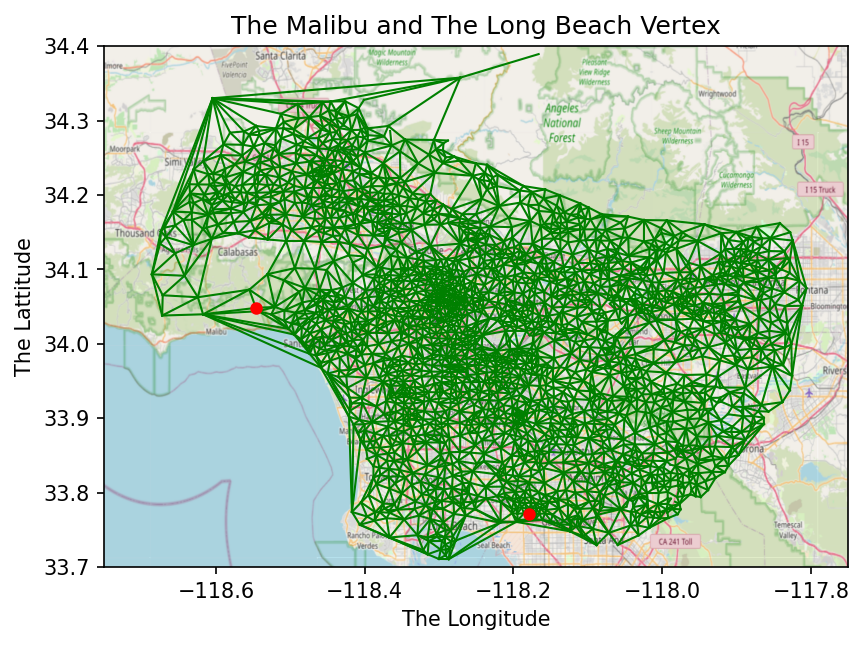

In [34]:
malibu = [-118.56, 34.04]
longbeach = [-118.18, 33.77]

velocity = np.array(g_d.vs['centloc'])

# Calculate the distances between vertices and Malibu location
malibu_dis = np.linalg.norm((velocity - malibu), axis=1)
malibu_v = np.argmin(malibu_dis)

# Calculate the distances between vertices and Long Beach location
longbeach_dis = np.linalg.norm((velocity - longbeach), axis=1)
longbeach_v = np.argmin(longbeach_dis)

# Plot the graph with Malibu and Long Beach vertices marked
plot_graph(g_d, 'The Malibu and The Long Beach Vertex')
plt.plot(g_d.vs[malibu_v]['centloc'][0], g_d.vs[malibu_v]['centloc'][1], 'o', color='red', markersize=5)
plt.plot(g_d.vs[longbeach_v]['centloc'][0], g_d.vs[longbeach_v]['centloc'][1], 'o', color='red', markersize=5)
plt.show()


In [35]:
maxflow = g_d.maxflow_value(malibu_v, longbeach_v, capacity='capacity')
print('The max flow between Malibu and Longbeach: ', maxflow)
print('The edge between Malibu and Longbeach: ',g_d.edge_connectivity(malibu_v, longbeach_v))
print('The degree of Malibu: ',g_d.degree(malibu_v))
print('The degree of Longbeach: ',g_d.degree(longbeach_v))

The max flow between Malibu and Longbeach:  22148.28944089882
The edge between Malibu and Longbeach:  4
The degree of Malibu:  4
The degree of Longbeach:  6


In [36]:
def plot_local_road(graph, v, title=''):
    plt.figure(dpi=150)
    for e in graph.es:
        v1 = graph.vs[e.source]['centloc']
        v2 = graph.vs[e.target]['centloc']
        data = np.vstack([v1, v2])
        x = data[:, 0]
        y = data[:, 1]
        plt.plot(x, y, c='green', linewidth=1)

    plt.plot(graph.vs[v]['centloc'][0], graph.vs[v]['centloc'][1], 'o', color='red', markersize=5)
    plt.title(title)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.xlim(graph.vs[v]['centloc'][0] - 0.05, graph.vs[v]['centloc'][0] + 0.05)
    plt.ylim(graph.vs[v]['centloc'][1] - 0.05, graph.vs[v]['centloc'][1] + 0.05)


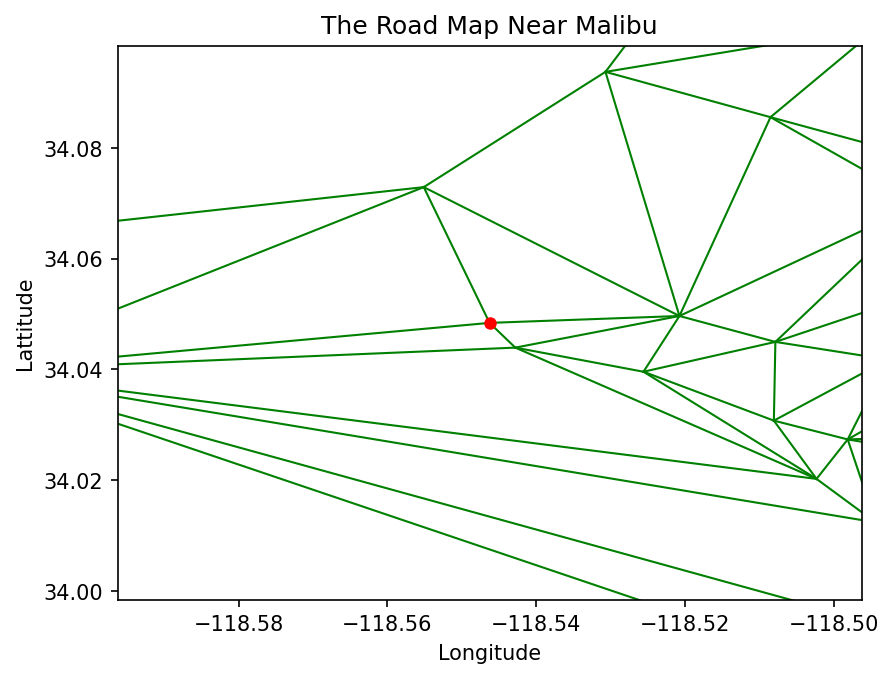

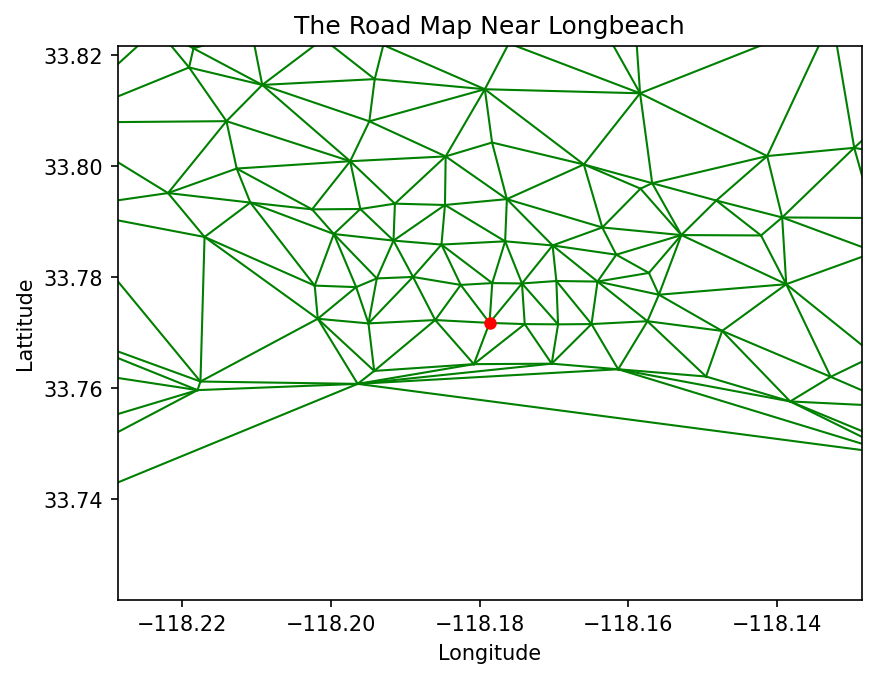

In [37]:
plot_local_road(g_d, malibu_v, 'The Road Map Near Malibu')
plt.show()
plot_local_road(g_d, longbeach_v, 'The Road Map Near Longbeach')
plt.show()

QUESTION 17: Plot G˜∆ on actual coordinates. Do you think the thresholding method worked?

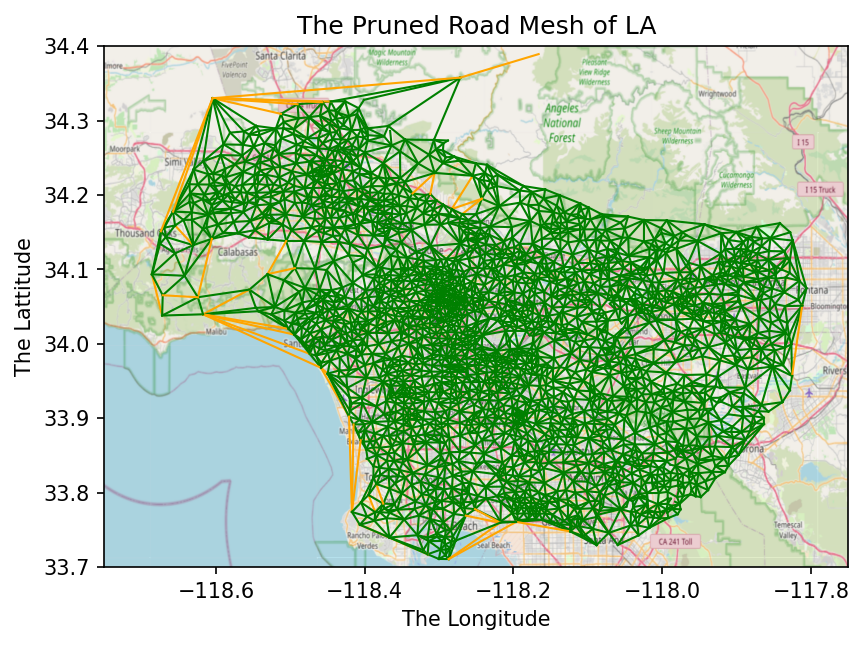

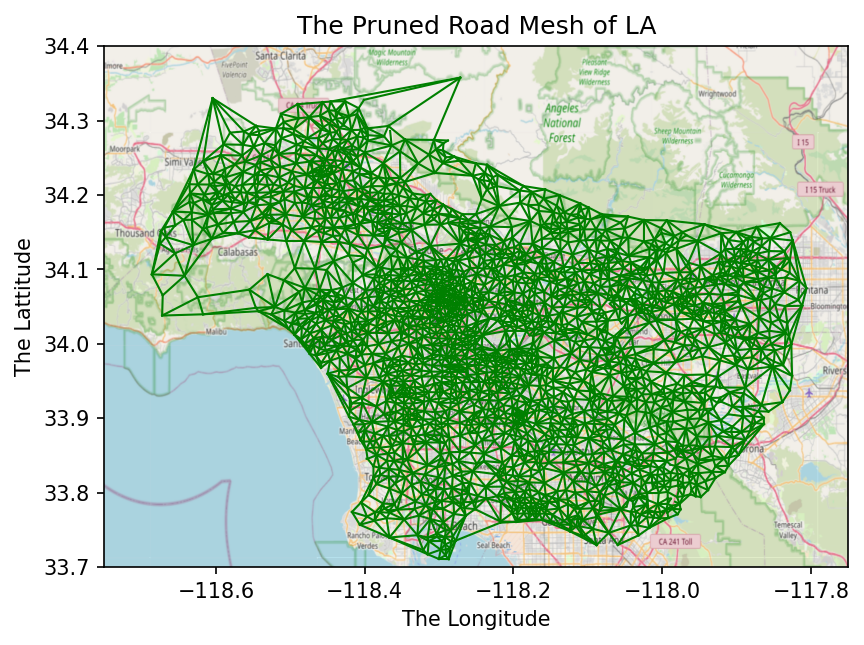

In [38]:
threshold_time = 750

# Select edges with time less than or equal to the threshold
edges_trim = g_d.es.select(time_le=threshold_time)

# Mark edges that are not in the trimmed edges
for e in g_d.es:
    if e not in edges_trim:
        e['mark'] = True

# Create a pruned graph using the trimmed edges
trimmedGraoh = g_d.subgraph_edges(edges_trim)

# Plot the original and pruned road mesh
plot_graph(g_d, 'The Pruned Road Mesh of LA')
plt.show()
plot_graph(trimmedGraoh, 'The Pruned Road Mesh of LA')
plt.show()


QUESTION 18: Now, repeat question 13 for G˜∆ and report the results. Do you see any changes? Why?

In [39]:
# Build a minimum spanning tree of the pruned graph trimmedGraoh
minspantree = trimmedGraoh.spanning_tree(weights=trimmedGraoh.es['time'])

# Print the details of the first 5 edges in the minimum spanning tree
for i in range(5):
    source_loc = minspantree.vs[minspantree.es[i].source]['centloc']
    target_loc = minspantree.vs[minspantree.es[i].target]['centloc']
    distance = minspantree.es[i]['distance']
    time = minspantree.es[i]['time']
    print(f"{source_loc} & {target_loc} & {distance} & {time}\n")

# Set properties for visualization of the minimum spanning tree
stl = {"vertex_size": 3}


[-118.12053321   34.10309557]&[-118.13138209   34.09626386]&0.8846284729321783&129.76500000000001

[-118.12053321   34.10309557]&[-118.11656383   34.09585388]&0.5698168028981732&118.33500000000001

[-118.13785063   34.09645121]&[-118.13138209   34.09626386]&0.4465164669415551&90.235

[-118.13785063   34.09645121]&[-118.13224544   34.10349303]&0.6210205804548343&126.475

[-118.13785063   34.09645121]&[-118.14184446   34.08538654]&0.8116750364782253&125.675



In [40]:
minspantree_cost = sum(minspantree.es['time'])
approximatecost_min = sys.maxsize
approximate_pth = []
pints = np.random.randint(1, high=len(trimmedGraoh.vs), size=30)
for point in tqdm(pints):
    cst_i, path = twoApprox(trimmedGraoh, point, 'time')
    if cst_i < approximatecost_min:
        approximatecost_min = cst_i
        approximate_pth = path


  0%|          | 0/30 [00:00<?, ?it/s]C:\Users\yyxyy\AppData\Local\Temp\ipykernel_5984\2647402605.py:12: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  cost_approx += (g.shortest_paths(pre[i], pre[i+1], weights=weight))[0][0]
100%|██████████| 30/30 [00:08<00:00,  3.47it/s]


C:\Users\yyxyy\AppData\Local\Temp\ipykernel_5984\550143446.py:1: DeprecationWarning: Graph.clusters() is deprecated; use Graph.connected_components() instead
  x = [g_trim.clusters().giant().vs[i]['centloc'][0] for i in path_approx]
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_5984\550143446.py:2: DeprecationWarning: Graph.clusters() is deprecated; use Graph.connected_components() instead
  y = [g_trim.clusters().giant().vs[i]['centloc'][1] for i in path_approx]


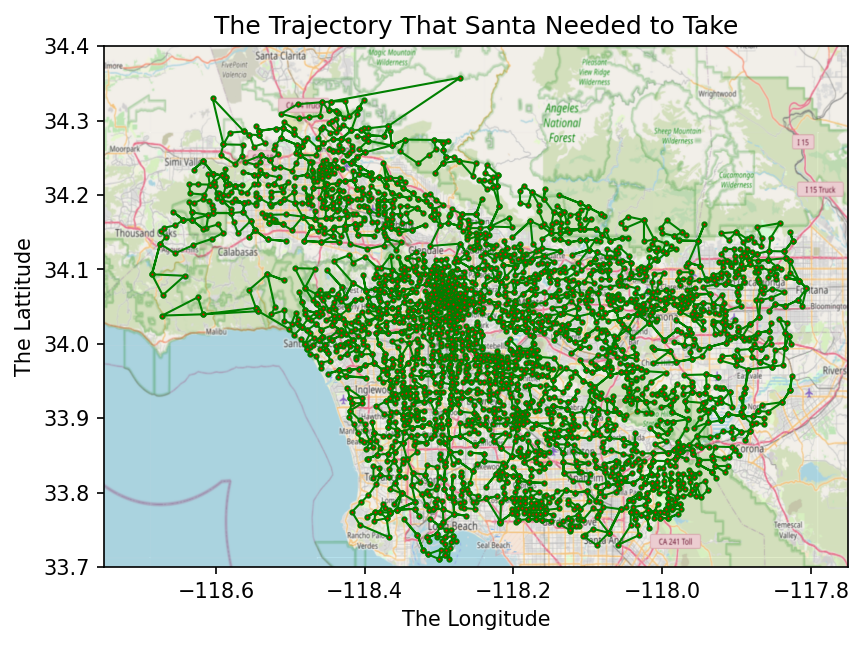

In [42]:
# Extract x and y coordinates for the given vertices in the approximate_pth list
x = [trimmedGraoh.clusters().giant().vs[i]['centloc'][0] for i in approximate_pth]
y = [trimmedGraoh.clusters().giant().vs[i]['centloc'][1] for i in approximate_pth]

# Define the bounding box and load the LA map image
bbox = (-118.75, -117.75, 33.7, 34.4)
la_map = plt.imread('map_LA.jpg')

# Plot the trajectory using the extracted coordinates
plt.figure(dpi=150)
plt.plot(x, y, marker='o', linewidth=1, markersize=2, markerfacecolor='red', color='green')
plt.title('The Trajectory That Santa Needed to Take')
plt.xlabel('The Longitude')
plt.ylabel('The Latitude')
plt.xlim(bbox[0], bbox[1])
plt.ylim(bbox[2], bbox[3])
plt.imshow(la_map, zorder=0, extent=bbox, aspect='equal')
plt.show()


QUESTION 19: Strategy 1 (geo distance, static): Reduce the maximum extra travelling distance. 

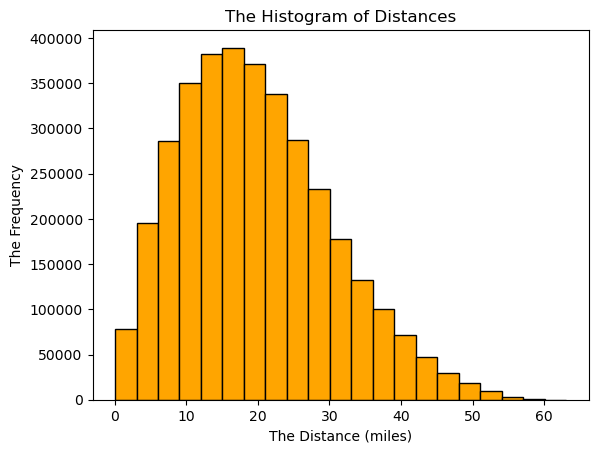

In [44]:
velocity = trimmedGraoh.vs['centloc']
velocity =  np.expand_dims(velocity, axis=0)
velocitytimeperiod = velocity.transpose(1, 0, 2)
distanve = np.linalg.norm((velocity - velocitytimeperiod), axis=2) * 69
triubium = np.triu(distanve, 1)
flattium = distanve[triubium.nonzero()]
binwidth = 3
bins = np.arange(np.min(flattium), np.max(flattium) + binwidth, binwidth)
plt.hist(flattium, bins=bins, color = 'orange', edgecolor = 'black')
plt.xlabel('The Distance (miles)')
plt.ylabel('The Frequency')
plt.title('The Histogram of Distances')
plt.show()

C:\Users\yyxyy\AppData\Local\Temp\ipykernel_5984\2437670880.py:2: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  shortest_dis = g_s1.shortest_paths(weights='distance')# O(|V||E|)


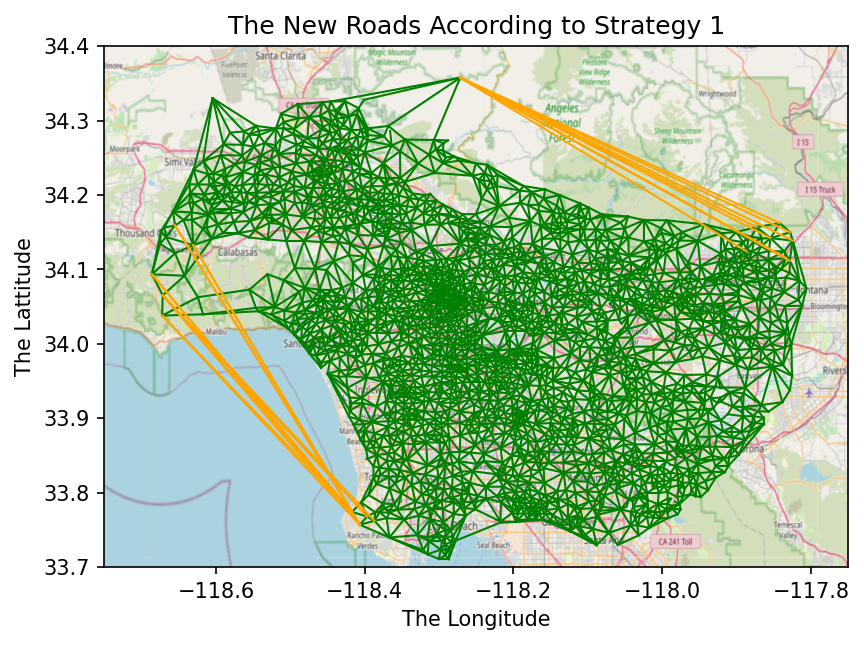

-117.85454409302326,34.142120790697675&-118.27158981797648,34.35782482248528

-118.65489981553401,34.15918811650484&-118.40648371022725,33.75689578693178

-118.39683944230771,33.7679271025641&-118.67145511923503,34.06533878290219

-117.88665511320752,34.12443260377358&-118.27158981797648,34.35782482248528

-118.63048660074622,34.1327155932836&-118.40648371022725,33.75689578693178

-118.3868687012987,33.76222715584416&-118.67145511923503,34.06533878290219

-118.40648371022725,33.75689578693178&-118.68599468727271,34.09347549818183

-117.82467288479266,34.13885138248847&-118.27158981797648,34.35782482248528

-117.82866074137928,34.111707206896554&-118.27158981797648,34.35782482248528

-117.83331135955059,34.11532583146067&-118.27158981797648,34.35782482248528

-118.65489981553401,34.15918811650484&-118.41714115454548,33.774103109090916

-118.63048660074622,34.1327155932836&-118.41714115454548,33.774103109090916

-118.41714115454548,33.774103109090916&-118.68599468727271,34.09347549818183

In [45]:
# Create a deepcopy of the trimmedGraoh
graphstrategy1 = deepcopy(trimmedGraoh)

# Calculate the shortest distance paths in the graph
shortest_dis = graphstrategy1.shortest_paths(weights='distance')

# Calculate the extra distance for each pair of vertices
extra_dis = shortest_dis - distance

# Retain only the upper triangular part of extra_dis
extra_dis = np.triu(extra_dis, 1)

# Find the indices of the largest extra distances
v_source, v_target = np.unravel_index(np.argsort(extra_dis, axis=None), extra_dis.shape)
v_source = v_source[-20:]
v_target = v_target[-20:]

# Create a list of edges and their attributes
edges_extra = list(zip(v_source, v_target))
edges_dict = defaultdict(list)
edges_dict['distance'] = distance[v_source, v_target]
edges_dict['mark'] = [True] * 20

# Add the extra edges to the graph with their attributes
graphstrategy1.add_edges(edges_extra, attributes=edges_dict)

# Plot the graph with the new roads
plot_graph(graphstrategy1, 'The New Roads According to Strategy 1')
plt.show()

# Print the coordinates of the added edges
for e in edges_extra:
    print(str(trimmedGraoh.vs[e[0]]['centloc'][0]) + ',' + str(trimmedGraoh.vs[e[0]]['centloc'][1]) + '&' +
          str(trimmedGraoh.vs[e[1]]['centloc'][0]) + ',' + str(trimmedGraoh.vs[e[1]]['centloc'][1]) + '\n')


QUESTION 20: Strategy 2 (geo distance, static, with frequency): In strategy1, we are using the geographical distance between pints to decide which new road to create. 

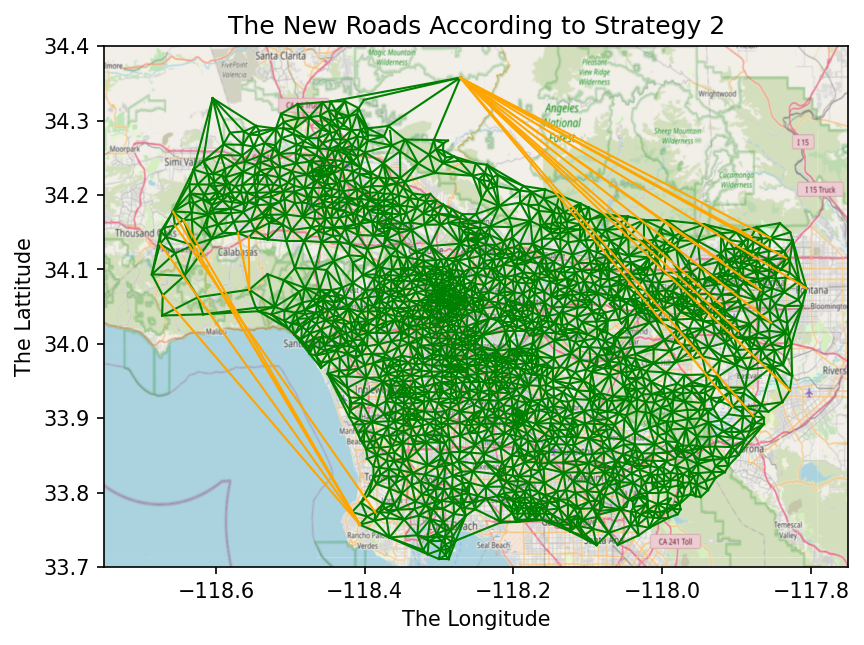

-118.5556897357724,34.143095296747944 & -118.55510068503939,34.07289098425196

-118.67506014705866,34.134544344919796 & -118.40648371022725,33.75689578693178

-117.80629424922105,34.074753919003115 & -118.27158981797648,34.35782482248528

-117.89783202222215,34.017286233333316 & -118.27158981797648,34.35782482248528

-118.27158981797648,34.35782482248528 & -117.90574051351348,33.91580480180181

-117.91934160606058,34.05099833333332 & -118.27158981797648,34.35782482248528

-118.27158981797648,34.35782482248528 & -117.82852631818183,33.93756910909091

-117.85366782967031,34.028488450549446 & -118.27158981797648,34.35782482248528

-118.27158981797648,34.35782482248528 & -117.87767651496998,33.9029280239521

-118.57017334070797,34.14872431415929 & -118.55510068503939,34.07289098425196

-117.8802836388889,34.14393644444445 & -118.27158981797648,34.35782482248528

-118.65489981553401,34.15918811650484 & -118.3857664336283,33.77363465486726

-117.86758253205127,34.07225523076923 & -118.271589

In [46]:
# Create a deepcopy of the trimmedGraoh
graphstrategy2 = deepcopy(trimmedGraoh)

# Generate random frequencies for each pair of vertices
frequencies = np.random.randint(1, 1001, (len(graphstrategy2.vs), len(graphstrategy2.vs)))

# Weight the extra distances by the frequencies
extra_dis_w = np.multiply(extra_dis, frequencies)

# Find the indices of the largest weighted extra distances
v_source, v_target = np.unravel_index(np.argsort(extra_dis_w, axis=None), extra_dis_w.shape)
v_source = v_source[-20:]
v_target = v_target[-20:]

# Create a list of edges and their attributes
edges_extra = list(zip(v_source, v_target))
edges_dict = defaultdict(list)
edges_dict['distance'] = distance[v_source, v_target]
edges_dict['mark'] = [True] * 20

# Add the extra edges to the graph with their attributes
graphstrategy2.add_edges(edges_extra, attributes=edges_dict)

# Plot the graph with the new roads
plot_graph(graphstrategy2, 'The New Roads According to Strategy 2')
plt.show()

# Print the coordinates of the added edges
for e in edges_extra:
    print(str(trimmedGraoh.vs[e[0]]['centloc'][0]) + ',' + str(trimmedGraoh.vs[e[0]]['centloc'][1]) + ' & ' +
          str(trimmedGraoh.vs[e[1]]['centloc'][0]) + ',' + str(trimmedGraoh.vs[e[1]]['centloc'][1]) + '\n')


QUESTION 21: Strategy 3 (geo distance, dynamic): In the above strategy, we are creating all roads at the same time. This time, we will create the roads one by one.

C:\Users\yyxyy\AppData\Local\Temp\ipykernel_5984\1709246645.py:3: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  shortest_dis = g_s3.shortest_paths(weights='distance') # O(|V||E|)


-118.41714115454548,33.774103109090916&-118.67145511923503,34.06533878290219

-117.84197423684212,34.16224818421053&-118.27158981797648,34.35782482248528

-118.57609893103452,34.163914112068966&-118.55510068503939,34.07289098425196

-117.90384881034481,34.12744793103448&-118.27158981797648,34.35782482248528

-117.94347146212125,34.160677848484866&-118.27158981797648,34.35782482248528

-117.99399975280905,34.16600654494379&-118.27158981797648,34.35782482248528

-118.41714115454548,33.774103109090916&-118.62418590723568,34.06269522170691

-118.046042942029,34.17109230434782&-118.27158981797648,34.35782482248528

-118.10868277868856,34.18016231147541&-118.27158981797648,34.35782482248528

-118.66929280689664,34.156163006896556&-117.98288185714287,33.787883428571426

-118.63048660074622,34.1327155932836&-118.36653025668451,33.80541077540108

-118.5556897357724,34.143095296747944&-118.53067983104125,34.09368131827117

-118.39748945762716,33.84561491864407&-118.67145511923503,34.065338782902

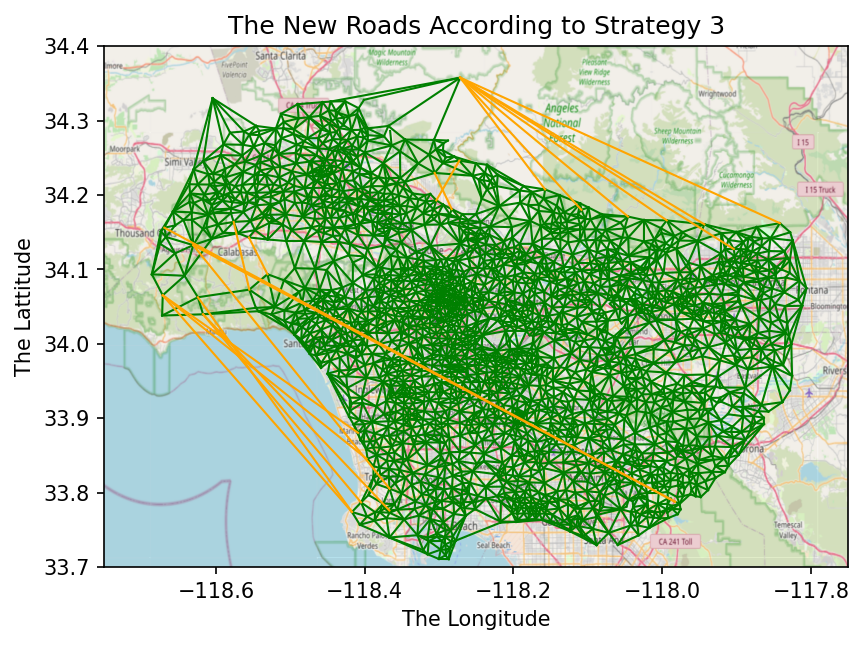

In [47]:
# Create a deepcopy of the trimmedGraoh
graphstrategy3 = deepcopy(trimmedGraoh)

# Add 20 new edges based on strategy 3
for i in range(20):
    # Calculate the shortest distances
    shortest_dis = graphstrategy3.shortest_paths(weights='distance')
    
    # Calculate the extra distances
    extra_dis = shortest_dis - distance
    extra_dis = np.triu(extra_dis, 1)
    
    # Find the indices of the maximum extra distance
    v_source, v_target = np.unravel_index(np.argmax(extra_dis, axis=None), extra_dis.shape)
    
    # Create a list of the new edge and its attributes
    edges_extra = [[v_source, v_target]]
    edges_dict = defaultdict(list)
    edges_dict['distance'] = distance[v_source, v_target]
    edges_dict['mark'] = [True] * 1
    
    # Add the new edge to the graph with its attributes
    graphstrategy3.add_edges(edges_extra, attributes=edges_dict)
    
    # Print the coordinates of the added edge
    print(str(trimmedGraoh.vs[edges_extra[0][0]]['centloc'][0]) + ',' + str(trimmedGraoh.vs[edges_extra[0][0]]['centloc'][1]) + '&' +
        str(trimmedGraoh.vs[edges_extra[0][1]]['centloc'][0]) + ',' + str(trimmedGraoh.vs[edges_extra[0][1]]['centloc'][1]) + '\n')

# Plot the graph with the new roads
plot_graph(graphstrategy3, 'The New Roads According to Strategy 3')
plt.show()


QUESTION 22: Strategy 4 (Travel time, static): We want to optimize to reduce the maximum extra travelling time. The extra travelling distance between 2 locations is the difference of the shortest traveling time and the straight line travel time. 

C:\Users\yyxyy\AppData\Local\Temp\ipykernel_5984\1888925327.py:2: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  shortest_dis = np.array(g_s4.shortest_paths(weights='distance'))
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_5984\1888925327.py:3: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  shortest_time = np.array(g_s4.shortest_paths(weights='time'))
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_5984\1888925327.py:4: RuntimeWarning: invalid value encountered in true_divide
  speed = shortest_dis / shortest_time


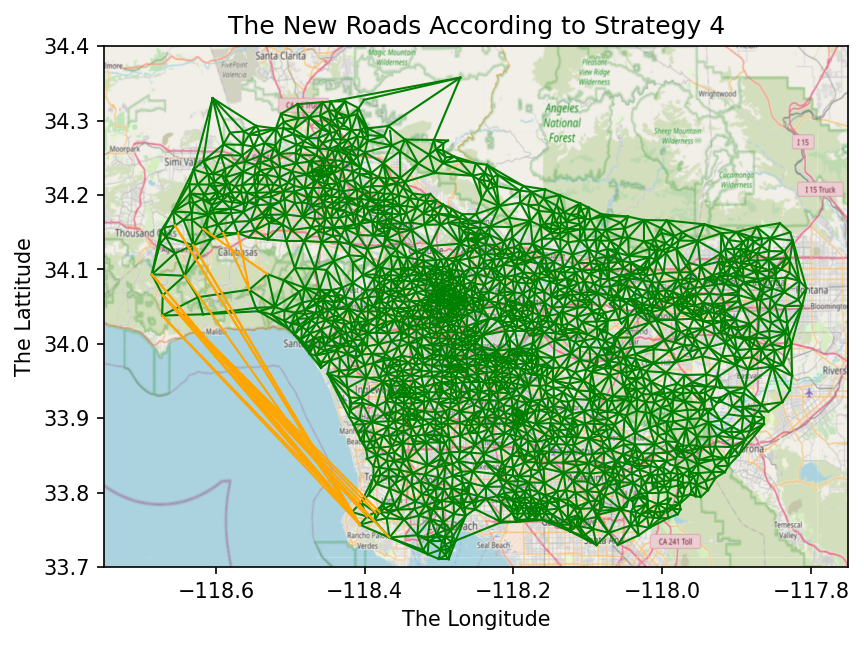

-118.41714115454548,33.774103109090916&-118.64214877275657,34.09155097353136

-118.65489981553401,34.15918811650484&-118.40648371022725,33.75689578693178

-118.59018528030296,34.14922015909091&-118.55510068503939,34.07289098425196

-118.65489981553401,34.15918811650484&-118.41714115454548,33.774103109090916

-118.63048660074622,34.1327155932836&-118.40648371022725,33.75689578693178

-118.3799100273973,33.77389164383562&-118.67145511923503,34.06533878290219

-118.57017334070797,34.14872431415929&-118.55510068503939,34.07289098425196

-118.6174550722892,34.15459418072292&-118.53067983104125,34.09368131827117

-118.63048660074622,34.1327155932836&-118.41714115454548,33.774103109090916

-118.3667227102714,33.73977623062013&-118.67145511923503,34.06533878290219

-118.40485093013112,33.78694638427947&-118.67145511923503,34.06533878290219

-118.3857664336283,33.77363465486726&-118.67145511923503,34.06533878290219

-118.67225393333337,34.03809095384618&-118.40648371022725,33.75689578693178

-1

In [48]:
# Create a deepcopy of the trimmedGraoh
graphstrategy4 = deepcopy(trimmedGraoh)

# Calculate shortest distances and times
shortest_dis = np.array(graphstrategy4.shortest_paths(weights='distance'))
shortest_time = np.array(graphstrategy4.shortest_paths(weights='time'))

# Calculate speed
speed = shortest_dis / shortest_time

# Calculate extra time
extra_time = shortest_time - distanve / speed
extra_time = np.triu(extra_time, 1)

# Find indices of the sorted extra time
v_source, v_target = np.unravel_index(np.argsort(extra_time, axis=None), extra_time.shape)

# Create a list of the new edges and their attributes
edges_extra = list(zip(v_source[-20:], v_target[-20:]))
edges_dict = defaultdict(list)
edges_dict['distance'] = distanve[v_source[-20:], v_target[-20:]]
edges_dict['mark'] = [True] * 20

# Add the new edges to the graph with their attributes
graphstrategy4.add_edges(edges_extra, attributes=edges_dict)

# Plot the graph with the new roads
plot_graph(graphstrategy4, 'The New Roads According to Strategy 4')
plt.show()

# Print the coordinates of the added edges
for e in edges_extra:
    print(str(trimmedGraoh.vs[e[0]]['centloc'][0]) + ',' + str(trimmedGraoh.vs[e[0]]['centloc'][1]) + '&' +
        str(trimmedGraoh.vs[e[1]]['centloc'][0]) + ',' + str(trimmedGraoh.vs[e[1]]['centloc'][1]) + '\n')


QUESTION 23: Strategy 5 (Travel time, dynamic): Similar to strategy 3, this time we will create roads one by one while optimizing the travel time.

C:\Users\yyxyy\AppData\Local\Temp\ipykernel_5984\348816711.py:3: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  shortest_dis = np.array(g_s5.shortest_paths(weights='distance'))
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_5984\348816711.py:4: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  shortest_time = np.array(g_s5.shortest_paths(weights='time'))
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_5984\348816711.py:5: RuntimeWarning: invalid value encountered in true_divide
  speed = shortest_dis / shortest_time


-118.41714115454548,33.774103109090916&-118.67145511923503,34.06533878290219

-118.6174550722892,34.15459418072292&-118.53067983104125,34.09368131827117

-118.57017334070797,34.14872431415929&-118.55510068503939,34.07289098425196

-118.41714115454548,33.774103109090916&-118.62418590723568,34.06269522170691

-117.84197423684212,34.16224818421053&-118.27158981797648,34.35782482248528

-117.89365872839508,34.05103139506174&-118.27158981797648,34.35782482248528

-117.90384881034481,34.12744793103448&-118.27158981797648,34.35782482248528

-117.94347146212125,34.160677848484866&-118.27158981797648,34.35782482248528

-117.95946314285713,33.94862083333332&-118.27158981797648,34.35782482248528

-118.39748945762716,33.84561491864407&-118.67145511923503,34.06533878290219

-118.01154852195125,33.99293787317071&-118.27158981797648,34.35782482248528

-117.99399975280905,34.16600654494379&-118.27158981797648,34.35782482248528

-118.53047408659789,34.14032269896909&-118.53067983104125,34.0936813182711

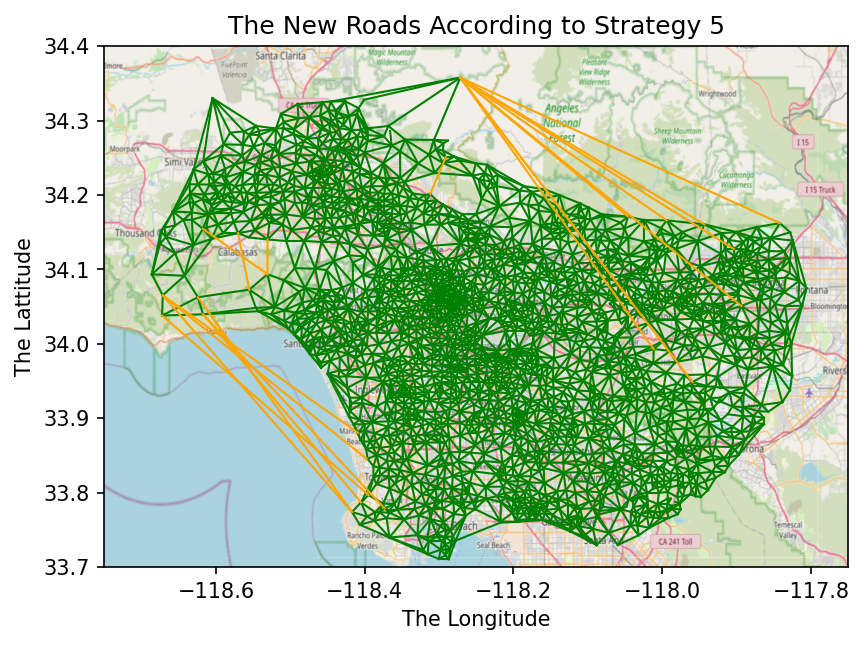

In [49]:
# Create a deepcopy of the trimmedGraoh
graphstrategy5 = deepcopy(trimmedGraoh)

# Iterate 20 times
for i in range(20):
    # Calculate shortest distances and times
    shortest_dis = np.array(graphstrategy5.shortest_paths(weights='distance'))
    shortest_time = np.array(graphstrategy5.shortest_paths(weights='time'))
    
    # Calculate speed
    speed = shortest_dis / shortest_time
    
    # Calculate extra time
    extra_time = shortest_time - distanve / speed
    extra_time = np.triu(extra_time, 1)
    
    # Find the indices of the maximum extra time
    v_source, v_target = np.unravel_index(np.argmax(extra_time, axis=None), extra_time.shape)
    
    # Create a list of the new edge and its attributes
    edges_extra = [[v_source, v_target]]
    edges_dict = defaultdict(list)
    edges_dict['distance'] = distanve[v_source, v_target]
    edges_dict['time'] = distanve[v_source, v_target] / speed[v_source, v_target]
    edges_dict['mark'] = [True] * 1
    
    # Add the new edge to the graph with its attributes
    graphstrategy5.add_edges(edges_extra, attributes=edges_dict)
    
    # Print the coordinates of the added edge
    print(str(trimmedGraoh.vs[edges_extra[0][0]]['centloc'][0]) + ',' + str(trimmedGraoh.vs[edges_extra[0][0]]['centloc'][1]) + '&' +
    str(trimmedGraoh.vs[edges_extra[0][1]]['centloc'][0]) + ',' + str(trimmedGraoh.vs[edges_extra[0][1]]['centloc'][1]) + '\n')

# Plot the graph with the new roads
plot_graph(graphstrategy5, 'The New Roads According to Strategy 5')
plt.show()


Question 25

Define our own task.